<a href="https://colab.research.google.com/github/Fiona-cherutto/house-price/blob/main/Moringa_Data_Science_Core_W7_Independent___Project_2020_07_FIONA_CHERUTTO_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Hass Consulting Company

## 1. Defining the Question

### a) Specifying the Data Analytic Question

---




As a Data Scientist, for Hass Consulting Company which is a real estate leader with over 25 years of experience. Study the factors that affect housing prices using the given information on real estate properties that was collected over the past few months. 


Create a model that would allow the company to accurately predict the sale of prices based on a couple of features such as square feet of the  living area, square feet area of parking Layout among others for a real estate properties. 




### b) Defining the Metric for Success

This project will be successful when: 1)We accurately predict the house prices based on the two factors:

### c) Understanding the context 

Hass Consulting Company which is a real estate leader with over 25 years of experience.
HassConsult Limited was formed in 1992 with a vision to establish a comprehensive Real Estate firm that reinvented the market patterns by introducing transparency, integrity and professionalism in a market calling for more global standards.

### d) Recording the Experimental Design

For this analysis will follow the following steps below


1.   Loading and previewing data
2.   Data cleanining
3.   EDA
4.   Implimenting the solution
5.   Challenging the solution
6.   Follow up question

### e) Data Relevance

The data provided for the analysis consist of factors that affect housing prices using the given information on real estate properties that was collected over the past few months for Hass Consulting company.

In [ ]:
%%html
<marquee style='width: 70%; color: green;'><b>We will work as a Data Scientist for the Hass Consulting Company to investigate  factors that affect housing prices on real estate properties.!</b></marquee>

## 2. Importing Libraries

In [1]:
#loading the libraries
import pandas as pd
import numpy as np
import seaborn as sb
import seaborn as sns
import scipy as sp
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,KFold,StratifiedKFold,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import mean_squared_error,r2_score,accuracy_score,f1_score,classification_report
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
import plotly.express as px 
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [ ]:
!pip install --upgrade plotly

## 3. Loarding datasetes

In [2]:
from google.colab import files
files.upload()

!unzip -q real estate analyst_Dataset.zip
!pip install --upgrade seaborn

Saving Independent Project Week 7 - house_data (1).csv to Independent Project Week 7 - house_data (1).csv
unzip:  cannot find or open real, real.zip or real.ZIP.
Requirement already up-to-date: seaborn in /usr/local/lib/python3.6/dist-packages (0.11.0)


## 4. Reading the Data

In [3]:
# Loading the Data from the source i.e. csv
# ---
House = pd.read_csv('/content/Independent Project Week 7 - house_data (1).csv')



## 5. Checking the Data

In [4]:
# Determining the no. of records in our dataset
print(f'\nHouse  contains {House.shape[0]} samples and {House.shape[1]} variables')



House  contains 21613 samples and 20 variables


In [5]:
# Previewing the top of our dataset

House.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [6]:
# Previewing Results dataset
House.tail()


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21608,263000018,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287
21612,1523300157,325000.0,2,0.75,1020,1076,2.0,0,0,3,7,1020,0,2008,0,98144,47.5941,-122.299,1020,1357


In [7]:
# Checking whether each column has an appropriate datatype
House.dtypes

id                 int64
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [8]:
# Determining the no. of records in our dataset and the respective datatypes
House.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  int64  
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

## 6. External Data Source Validation

### a.Validation

In [9]:
# Map the lowering function to all column names

House.columns = map(str.lower,House.columns)
House

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


## 7. Tidying the Dataset

In [10]:
# Printing the shape of our old dataset

print(House.shape)

(21613, 20)


In [11]:
# Identifying the Missing Data
# We count the number of non - missing values in the df dataframe
#
House.count()

id               21613
price            21613
bedrooms         21613
bathrooms        21613
sqft_living      21613
sqft_lot         21613
floors           21613
waterfront       21613
view             21613
condition        21613
grade            21613
sqft_above       21613
sqft_basement    21613
yr_built         21613
yr_renovated     21613
zipcode          21613
lat              21613
long             21613
sqft_living15    21613
sqft_lot15       21613
dtype: int64

In [12]:
# cheacking unique
House.nunique()

id               21436
price             3625
bedrooms            13
bathrooms           30
sqft_living       1038
sqft_lot          9782
floors               6
waterfront           2
view                 5
condition            5
grade               12
sqft_above         946
sqft_basement      306
yr_built           116
yr_renovated        70
zipcode             70
lat               5034
long               752
sqft_living15      777
sqft_lot15        8689
dtype: int64

In [13]:
#cheaking for null
House.isnull().sum()

id               0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [14]:
#checking for duplicates in the results column
House.duplicated().sum()

3

In [15]:
#dropping the duplicated columns in the house dataset
#keeping the first record of the duplicates
House.drop_duplicates(subset = None, keep = 'first', inplace = True)
House.shape

(21610, 20)

In [16]:
# Checking if there is any missing value in dataframe as a whole

House.isnull().any()

id               False
price            False
bedrooms         False
bathrooms        False
sqft_living      False
sqft_lot         False
floors           False
waterfront       False
view             False
condition        False
grade            False
sqft_above       False
sqft_basement    False
yr_built         False
yr_renovated     False
zipcode          False
lat              False
long             False
sqft_living15    False
sqft_lot15       False
dtype: bool

In [17]:
# Let's see these non-duplicate files
House.duplicated().any()


False

In [18]:
# replace all splces with "_"
House.columns = House.columns.str.replace(' ','_')
print (House)

               id     price  bedrooms  ...     long  sqft_living15  sqft_lot15
0      7129300520  221900.0         3  ... -122.257           1340        5650
1      6414100192  538000.0         3  ... -122.319           1690        7639
2      5631500400  180000.0         2  ... -122.233           2720        8062
3      2487200875  604000.0         4  ... -122.393           1360        5000
4      1954400510  510000.0         3  ... -122.045           1800        7503
...           ...       ...       ...  ...      ...            ...         ...
21608   263000018  360000.0         3  ... -122.346           1530        1509
21609  6600060120  400000.0         4  ... -122.362           1830        7200
21610  1523300141  402101.0         2  ... -122.299           1020        2007
21611   291310100  400000.0         3  ... -122.069           1410        1287
21612  1523300157  325000.0         2  ... -122.299           1020        1357

[21610 rows x 20 columns]


In [19]:
#checking for outliers
House.kurt()

id                -1.260438
price             34.517438
bedrooms          49.060108
bathrooms          1.279637
sqft_living        5.242223
sqft_lot         285.040621
floors            -0.484246
waterfront       127.614090
view              10.902118
condition          0.525688
grade              1.191090
sqft_above         3.402008
sqft_basement      2.714886
yr_built          -0.657207
yr_renovated      18.723733
zipcode           -0.853604
lat               -0.676601
long               1.049829
sqft_living15      1.597009
sqft_lot15       150.743275
dtype: float64

In [20]:
# dropping the outliers
Q1 = House.quantile(0.25)
Q3 = House.quantile(0.75)
IQR = Q3 - Q1

house = House[~((House < (Q1 - 1.5 * IQR)) |(House> (Q3 + 1.5 * IQR))).any(axis=1)]
house.kurt()

id              -1.275233
price            0.445513
bedrooms        -0.273280
bathrooms       -0.816748
sqft_living     -0.094513
sqft_lot         0.489573
floors          -0.219330
waterfront       0.000000
view             0.000000
condition        0.310707
grade           -0.340484
sqft_above       0.409482
sqft_basement    0.500280
yr_built        -0.653523
yr_renovated     0.000000
zipcode         -0.954433
lat             -0.851700
long            -0.263259
sqft_living15    0.294050
sqft_lot15       0.188031
dtype: float64

In [21]:
#What unique values are there in each column entry in the dataset?
for i in House.columns:
 print(House[i].unique())
 print ("\n")

[7129300520 6414100192 5631500400 ... 1523300141  291310100 1523300157]


[221900. 538000. 180000. ... 541800. 610685. 402101.]


[ 3  2  4  5  1  6  7  0  8  9 11 10 33]


[1.   2.25 3.   2.   4.5  1.5  2.5  1.75 2.75 3.25 4.   3.5  0.75 4.75
 5.   4.25 3.75 0.   1.25 5.25 6.   0.5  5.5  6.75 5.75 8.   7.5  7.75
 6.25 6.5 ]


[1180 2570  770 ... 3087 3118 1425]


[ 5650  7242 10000 ...  5813  2388  1076]


[1.  2.  1.5 3.  2.5 3.5]


[0 1]


[0 3 4 2 1]


[3 5 4 1 2]


[ 7  6  8 11  9  5 10 12  4  3 13  1]


[1180 2170  770 1050 1680 3890 1715 1060 1890 1860  860 1430 1370 1810
 1980 1600 1200 1250 2330 2270 1070 2450 1710 1750 1400  790 2570 2320
 1190 1510 1090 1280  930 2360  890 2620 2600 3595 1570  920 3160  990
 2290 2165 1640 1000 2130 2830 2250 2420 3250 1850 1590 1260 2519 1540
 1110 1770 2720 2240 3070 2380 2390  880 1040  910 3450 2350 1900 1010
  960 2660 1610  765 3520 1290 1960 1160 1210 1270 1440 2190 2920 1460
 1170 1240 3140 2030 2310  700 1080 2520 2780 1560 1450 172

## 8. Feature Engineering

In [22]:
from math import radians, cos, sin, asin, sqrt

def single_pt_haversine(lat, lng, degrees=True):
    """
    'Single-point' Haversine: Calculates the great circle distance
    between a point on Earth and the (0, 0) lat-long coordinate
    """
    r = 6371 # Earth's radius (km). Have r = 3956 if you want miles

    # Convert decimal degrees to radians
    if degrees:
        lat, lng = map(radians, [lat, lng])

    # 'Single-point' Haversine formula
    a = sin(lat/2)**2 + cos(lat) * sin(lng/2)**2
    d = 2 * r * asin(sqrt(a)) 

    return d

In [23]:
house['harvesine_distance'] = [single_pt_haversine(latitude, longitude) for latitude, longitude in zip(house['lat'], house['long'])]
house.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,harvesine_distance
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,12357.176658
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,12344.898391
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,12365.980586
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,12337.805892
6,1321400060,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819,12371.404390


In [24]:
house.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,harvesine_distance
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,12357.176658
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,12344.898391
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,12365.980586
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,12337.805892
6,1321400060,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819,12371.404390


In [25]:
House.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [26]:
House.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

## 9. Exploratory Analysis

In [ ]:
House.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161000e+04,2.161000e+04,21610.000000,21610.000000,21610.000000,2.161000e+04,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000
mean,4.580161e+09,5.401789e+05,3.370847,2.114739,2079.881212,1.510829e+04,1.494239,0.007543,0.234197,3.409440,7.656779,1788.347894,291.533318,1971.003609,84.322351,98077.945673,47.560049,-122.213910,1986.518695,12769.031976
std,2.876547e+09,3.673876e+05,0.930110,0.770204,918.500299,4.142323e+04,0.539994,0.086523,0.766136,0.650764,1.175500,828.138723,442.596699,29.372639,401.499264,53.505373,0.138572,0.140833,685.425781,27305.972464
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.216125e+05,3.000000,1.750000,1425.500000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.470925,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.619000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068875e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [ ]:
df_num =House.describe()
df_num

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161000e+04,2.161000e+04,21610.000000,21610.000000,21610.000000,2.161000e+04,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000
mean,4.580161e+09,5.401789e+05,3.370847,2.114739,2079.881212,1.510829e+04,1.494239,0.007543,0.234197,3.409440,7.656779,1788.347894,291.533318,1971.003609,84.322351,98077.945673,47.560049,-122.213910,1986.518695,12769.031976
std,2.876547e+09,3.673876e+05,0.930110,0.770204,918.500299,4.142323e+04,0.539994,0.086523,0.766136,0.650764,1.175500,828.138723,442.596699,29.372639,401.499264,53.505373,0.138572,0.140833,685.425781,27305.972464
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.216125e+05,3.000000,1.750000,1425.500000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.470925,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.619000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068875e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


>Density Plots

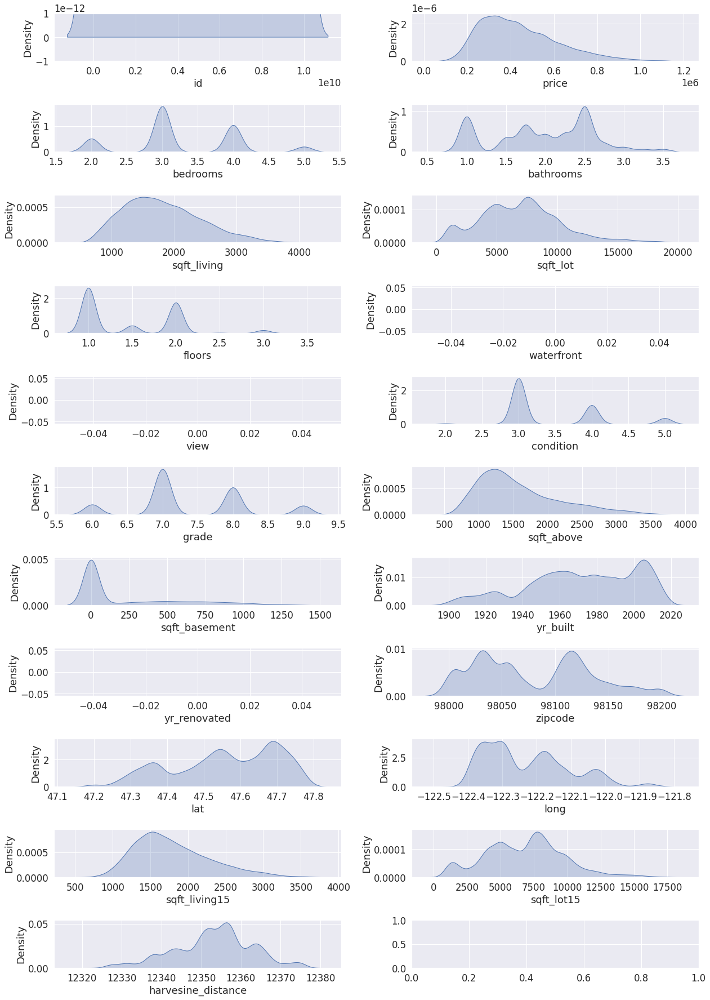

In [ ]:
# Plotting density plots to show dispersion of 
# Setting the figure size to 18 by 25
sns.set(font_scale=1.5)
fig, axes = plt.subplots(11, 2, figsize=(18, 25))
axes = [ax for axes_row in axes for ax in axes_row]
for i, c in enumerate(df_num1):
  plot = sns.kdeplot(data=house, x=c, ax=axes[i], fill=True)
plt.tight_layout()

In [ ]:
house.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'harvesine_distance'],
      dtype='object')

In [ ]:
num = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'grade', 'sqft_above',
       'sqft_basement','sqft_living15', 'sqft_lot15']

>Boxplot

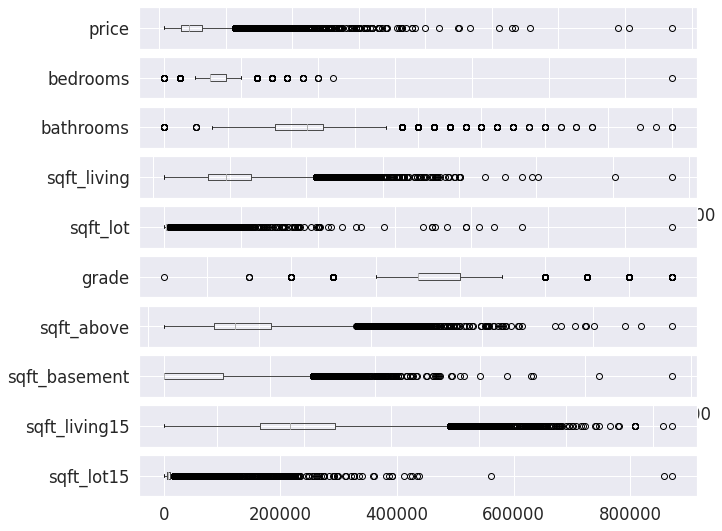

In [ ]:
fig, axes = plt.subplots(10, 1, figsize=(10, 9))
for i, c in enumerate(num):
  _ = House[[c]].boxplot(ax=axes[i], vert=False)

The outliers will not be dropped, since they are importamt at the moment

>Piechart 

Pie chart for bedrooms count

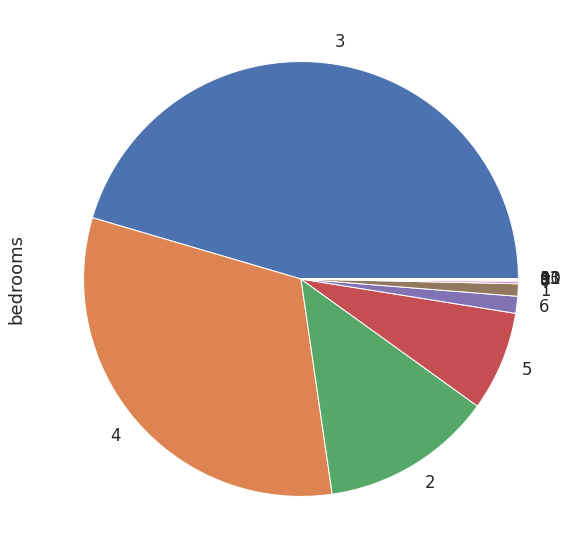

In [ ]:
#The percantage of 
House.bedrooms.value_counts().plot(kind = 'pie',figsize = (15, 10))
plt.show()

From the pie chart above we can see that majority of the rented are three bedrooms

Pie chart for floor count

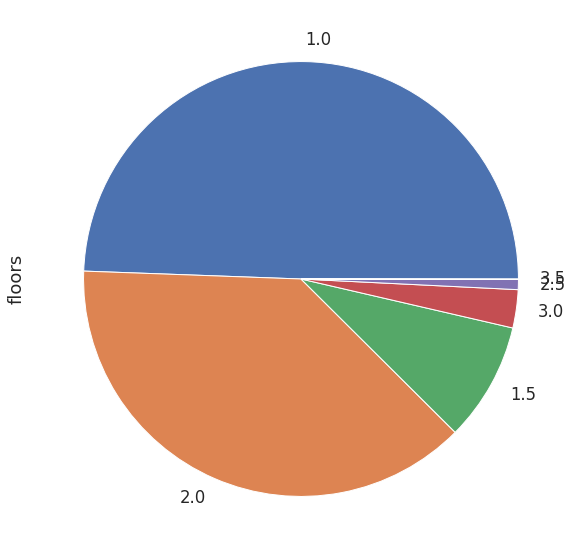

In [ ]:
House.floors.value_counts().plot(kind = 'pie', figsize = (15, 10))
plt.show()

From the pie chart above we can see that majority of the rented are first floor

>Bar graph

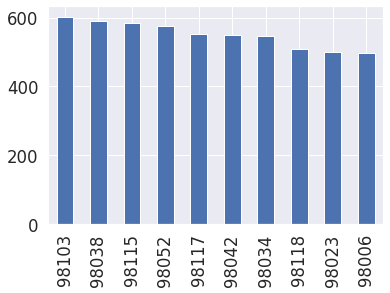

In [ ]:
#Plotting a bar graph of zipcode

House['zipcode'].value_counts().head(10).plot.bar()

From the bar graph above we can see that majority of the games played were friendly

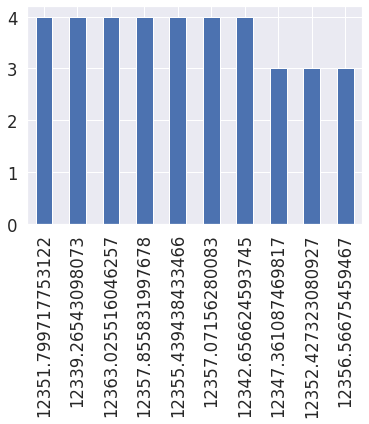

In [ ]:
#Plotting a bar graph of tournament

house['harvesine_distance'].value_counts().head(10).plot.bar()

From the bar graph above we can see that majority of house owners live in seven diffrent locations

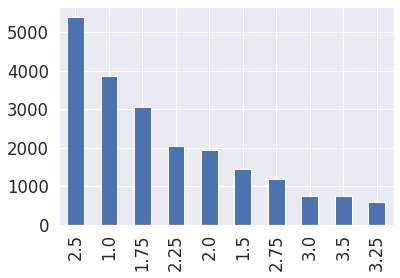

In [ ]:
#plotting a bar graph for the confederation


House['bathrooms'].value_counts().head(10).plot.bar()

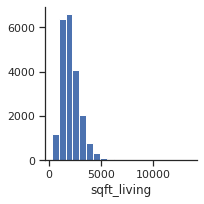

In [ ]:
#Plot histogram showing distribution of the BlueCars taken column
sns.set(style='ticks', color_codes=True)

fig, axes =  figsize=(10, 14)
bt_hist = sns.FacetGrid(House)
bt_hist.map(plt.hist, 'sqft_living', bins=20)

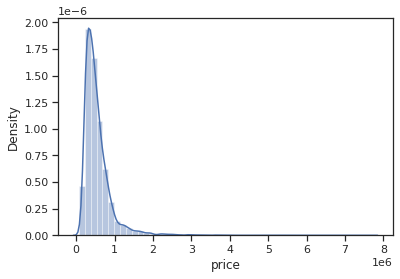

In [ ]:
# univariate analysis: 
sns.distplot(House.price);

> Scatterplots

>Measures of Central Tendency

In [ ]:
#Median
house.median()

id                    4.037800e+09
price                 4.050000e+05
bedrooms              3.000000e+00
bathrooms             2.000000e+00
sqft_living           1.740000e+03
sqft_lot              7.020000e+03
floors                1.000000e+00
waterfront            0.000000e+00
view                  0.000000e+00
condition             3.000000e+00
grade                 7.000000e+00
sqft_above            1.430000e+03
sqft_basement         0.000000e+00
yr_built              1.974000e+03
yr_renovated          0.000000e+00
zipcode               9.807200e+04
lat                   4.756970e+01
long                 -1.222640e+02
sqft_living15         1.710000e+03
sqft_lot15            7.172000e+03
harvesine_distance    1.235400e+04
dtype: float64

>Measures of Dispersion

>Standard Deviation

In [ ]:
# Finding the standard deviation
house.std()

id                    2.851519e+09
price                 1.805742e+05
bedrooms              7.729422e-01
bathrooms             6.460580e-01
sqft_living           6.147673e+02
sqft_lot              3.355737e+03
floors                5.479080e-01
waterfront            0.000000e+00
view                  0.000000e+00
condition             6.473177e-01
grade                 8.052048e-01
sqft_above            6.015242e+02
sqft_basement         3.533711e+02
yr_built              2.925294e+01
yr_renovated          0.000000e+00
zipcode               5.347750e+01
lat                   1.420908e-01
long                  1.236878e-01
sqft_living15         5.074492e+02
sqft_lot15            2.987775e+03
harvesine_distance    9.852894e+00
dtype: float64

>Variance

In [ ]:
# Finding the standard deviation
house.var()

id                    8.131161e+18
price                 3.260704e+10
bedrooms              5.974397e-01
bathrooms             4.173909e-01
sqft_living           3.779388e+05
sqft_lot              1.126097e+07
floors                3.002032e-01
waterfront            0.000000e+00
view                  0.000000e+00
condition             4.190202e-01
grade                 6.483548e-01
sqft_above            3.618314e+05
sqft_basement         1.248712e+05
yr_built              8.557346e+02
yr_renovated          0.000000e+00
zipcode               2.859843e+03
lat                   2.018980e-02
long                  1.529867e-02
sqft_living15         2.575046e+05
sqft_lot15            8.926797e+06
harvesine_distance    9.707953e+01
dtype: float64

>Range

In [ ]:
# Finding the min and max values 
house_max = house.max()
house_min = house.min()

# Calculating the range
house_max - house_min

id               9.899000e+09
price            7.625000e+06
bedrooms         3.300000e+01
bathrooms        8.000000e+00
sqft_living      1.325000e+04
sqft_lot         1.650839e+06
floors           2.500000e+00
waterfront       1.000000e+00
view             4.000000e+00
condition        4.000000e+00
grade            1.200000e+01
sqft_above       9.120000e+03
sqft_basement    4.820000e+03
yr_built         1.150000e+02
yr_renovated     2.015000e+03
zipcode          1.980000e+02
lat              6.217000e-01
long             1.204000e+00
sqft_living15    5.811000e+03
sqft_lot15       8.705490e+05
dtype: float64

>Inter-Quartile Range

In [ ]:
# Finding the quantiles of the herbicide average prices
house.quantile([0.25,0.5,0.75])

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,harvesine_distance
0.25,2.321300e+09,300000.0,3.0,1.5,1350.0,4690.0,1.0,0.0,0.0,3.0,7.0,1140.0,0.0,1952.0,0.0,98033.0,47.4576,-122.333,1430.0,4800.0,12347.302192
0.50,4.037800e+09,405000.0,3.0,2.0,1740.0,7020.0,1.0,0.0,0.0,3.0,7.0,1430.0,0.0,1974.0,0.0,98072.0,47.5697,-122.264,1710.0,7172.0,12354.000472
0.75,7.453500e+09,547500.0,4.0,2.5,2210.0,8925.0,2.0,0.0,0.0,4.0,8.0,1910.0,450.0,1999.0,0.0,98118.0,47.6835,-122.153,2090.5,8649.5,12358.877621


>Skewness

In [ ]:
# Determining the skeweness
house.skew()

id                    0.186783
price                 0.842101
bedrooms              0.242557
bathrooms            -0.093395
sqft_living           0.548726
sqft_lot              0.528827
floors                0.772488
waterfront            0.000000
view                  0.000000
condition             1.118044
grade                 0.318533
sqft_above            0.965473
sqft_basement         1.322715
yr_built             -0.450214
yr_renovated          0.000000
zipcode               0.320680
lat                  -0.442387
long                  0.684149
sqft_living15         0.750573
sqft_lot15            0.297575
harvesine_distance   -0.278168
dtype: float64

>Kurtosis

In [ ]:
# Determining the Kurtosis 
house.kurt()

id                   -1.275233
price                 0.445513
bedrooms             -0.273280
bathrooms            -0.816748
sqft_living          -0.094513
sqft_lot              0.489573
floors               -0.219330
waterfront            0.000000
view                  0.000000
condition             0.310707
grade                -0.340484
sqft_above            0.409482
sqft_basement         0.500280
yr_built             -0.653523
yr_renovated          0.000000
zipcode              -0.954433
lat                  -0.851700
long                 -0.263259
sqft_living15         0.294050
sqft_lot15            0.188031
harvesine_distance   -0.034328
dtype: float64

In [ ]:
#Displaying the summary statistics of the dataframe
#
House.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161000e+04,2.161000e+04,21610.000000,21610.000000,21610.000000,2.161000e+04,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000,21610.000000
mean,4.580161e+09,5.401789e+05,3.370847,2.114739,2079.881212,1.510829e+04,1.494239,0.007543,0.234197,3.409440,7.656779,1788.347894,291.533318,1971.003609,84.322351,98077.945673,47.560049,-122.213910,1986.518695,12769.031976
std,2.876547e+09,3.673876e+05,0.930110,0.770204,918.500299,4.142323e+04,0.539994,0.086523,0.766136,0.650764,1.175500,828.138723,442.596699,29.372639,401.499264,53.505373,0.138572,0.140833,685.425781,27305.972464
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.216125e+05,3.000000,1.750000,1425.500000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.470925,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.619000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068875e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [ ]:
#Displaying the summary statistics of the dataframe
#
house.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,harvesine_distance
count,1.493500e+04,1.493500e+04,14935.000000,14935.000000,14935.000000,14935.000000,14935.000000,14935.0,14935.0,14935.000000,14935.000000,14935.000000,14935.000000,14935.000000,14935.0,14935.000000,14935.000000,14935.000000,14935.000000,14935.000000,14935.000000
mean,4.729214e+09,4.386582e+05,3.262337,1.972179,1814.293940,6988.896150,1.471342,0.0,0.0,3.420623,7.380516,1585.198594,229.095347,1971.708604,0.0,98079.765383,47.558906,-122.230169,1796.942819,6868.331034,12353.098405
std,2.851519e+09,1.805742e+05,0.772942,0.646058,614.767257,3355.737263,0.547908,0.0,0.0,0.647318,0.805205,601.524228,353.371132,29.252941,0.0,53.477499,0.142091,0.123688,507.449152,2987.774641,9.852894
min,2.800031e+06,8.200000e+04,2.000000,0.750000,560.000000,520.000000,1.000000,0.0,0.0,2.000000,6.000000,480.000000,0.000000,1900.000000,0.0,98001.000000,47.189500,-122.472000,620.000000,651.000000,12320.628498
25%,2.321300e+09,3.000000e+05,3.000000,1.500000,1350.000000,4690.000000,1.000000,0.0,0.0,3.000000,7.000000,1140.000000,0.000000,1952.000000,0.0,98033.000000,47.457600,-122.333000,1430.000000,4800.000000,12347.302192
50%,4.037800e+09,4.050000e+05,3.000000,2.000000,1740.000000,7020.000000,1.000000,0.0,0.0,3.000000,7.000000,1430.000000,0.000000,1974.000000,0.0,98072.000000,47.569700,-122.264000,1710.000000,7172.000000,12354.000472
75%,7.453500e+09,5.475000e+05,4.000000,2.500000,2210.000000,8925.000000,2.000000,0.0,0.0,4.000000,8.000000,1910.000000,450.000000,1999.000000,0.0,98118.000000,47.683500,-122.153000,2090.500000,8649.500000,12358.877621
max,9.900000e+09,1.130000e+06,5.000000,3.500000,4200.000000,19141.000000,3.500000,0.0,0.0,5.000000,9.000000,3740.000000,1400.000000,2015.000000,0.0,98199.000000,47.777600,-121.821000,3640.000000,17550.000000,12377.629848


In [ ]:
import plotly.express as px


>Boxplot to visualize house price

In [ ]:
fig= px.box(house, y='price')
fig.show()

In [ ]:
fig= px.box(House, y='price')
fig.show()

>Countplot 

Count plots for bedrooms

3     9822
4     6881
2     2760
5     1601
6      272
1      199
7       38
8       13
0       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

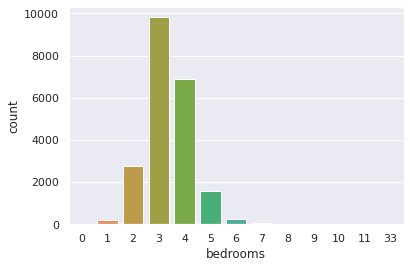

In [ ]:
sns.countplot(House["bedrooms"])
House["bedrooms"].value_counts()

3    7508
4    4411
2    2175
5     841
Name: bedrooms, dtype: int64

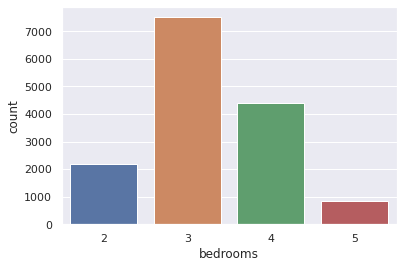

In [ ]:
sns.countplot(house["bedrooms"])
house["bedrooms"].value_counts()

Histogram of house bedrooms with counts

In [ ]:
fig= px.histogram(house, x="bedrooms")
fig.show()

Histogram to visualize price range

In [ ]:
fig= px.histogram(house, x="price")
fig.show()

In [ ]:
fig= px.histogram(House, x="price")
fig.show()

>Displots Distribution

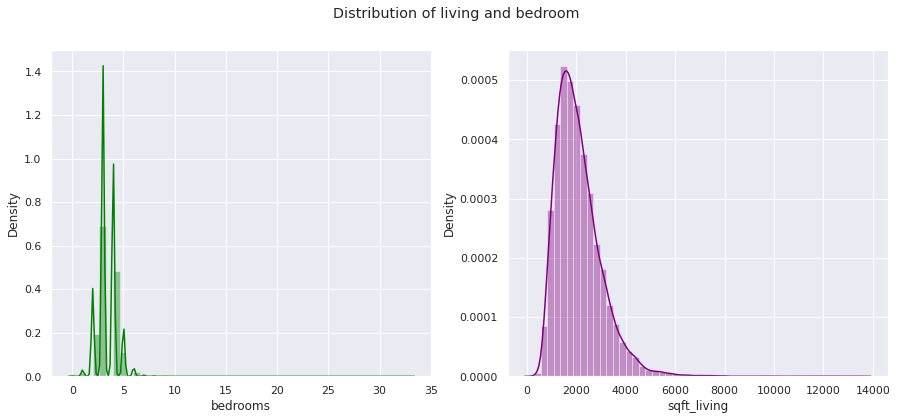

In [ ]:
# Using displots to plot distribution of home and away scores
#
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (15, 6))
plt.suptitle('Distribution of living and bedroom')
for ax, data, column, color in zip(axes.flatten(), House, ['bedrooms', 'sqft_living'], ['green', 'purple']):
  sns.distplot(House[column], ax = ax, hist = True, color = color)
  

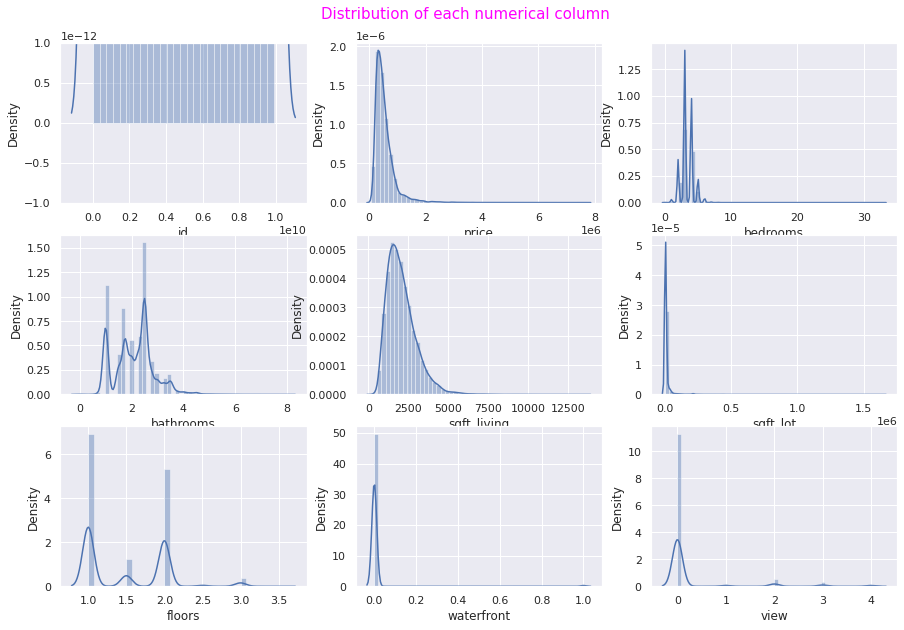

In [ ]:
 #Plotting histograms for each of the numerical columns to test for normality
# For easy analysis, the histograms have been plotted using subplots
# A fig object, i.e the canvas has been created measuring 15 by 10
# Nine subplots have been added into the fig object
# The nine subplots have been arranged into three rows and three columns
# A for loop has been used to plot each of the numerical columns into the subplots
# The seaborn plotting style has been set to dark grid for better visibility
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15, 10))
fig.suptitle('Distribution of each numerical column', y= 0.93, color = 'magenta', fontsize = 15)

for ax, data, name in zip(axes.flatten(), House, df_num):
  sns.distplot(House[name], ax = ax)

In [ ]:
fig = px.histogram(house, x='bedrooms', color ='price')
fig.show()

In [ ]:
fig = px.histogram(House, x='bedrooms', color ='price')
fig.show()

In [ ]:
fig = px.histogram(house, x='price', color ='bedrooms')
fig.show()

>Piechart to see house price and bedrooms

In [ ]:
fig = px.pie(house, values="price", names="bedrooms")
fig.show()

In [ ]:
fig = px.pie(house, values="price", names="grade")
fig.show()

In [ ]:
fig=px.box(house, x="grade",y="price")
fig.show()

In [ ]:
fig=px.box(house, x="bedrooms",y="price")
fig.show()

>Bivariate Analysis

In [ ]:
house.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,harvesine_distance
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,12357.176658
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,12344.898391
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,12365.980586
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,12337.805892
6,1321400060,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819,12371.404390


Text(0.5, 1.0, 'Price vs Square Feet')

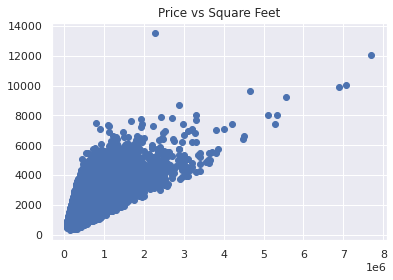

In [ ]:
plt.scatter(House.price,House.sqft_living)
plt.title("Price vs Square Feet")

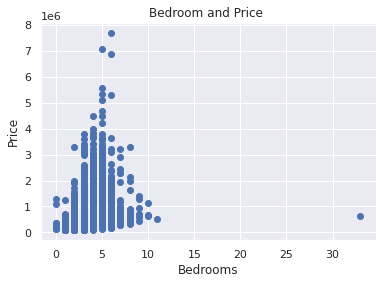

<function seaborn.utils.despine>

In [ ]:
plt.scatter(House.bedrooms,House.price)
plt.title("Bedroom and Price ")
plt.xlabel("Bedrooms")
plt.ylabel("Price")
plt.show()
sns.despine

>House Price change over Time

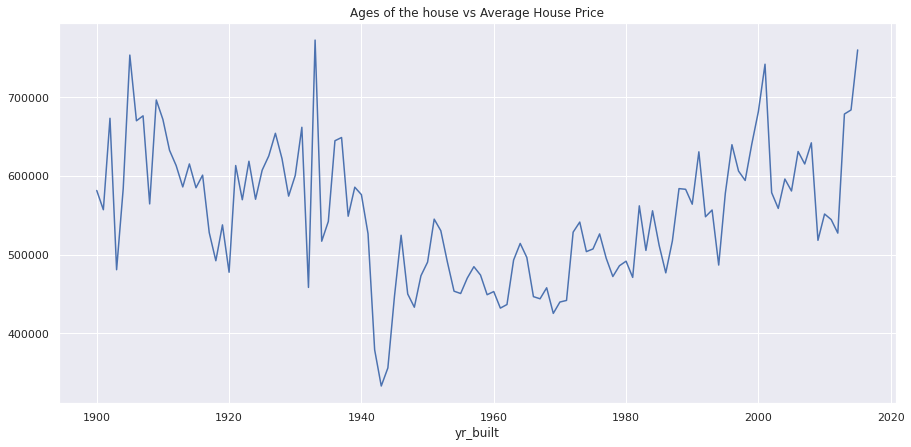

In [ ]:
#House Price change over Time
temp = House.groupby(['yr_built']).price.mean()
temp.plot(figsize=(15,7),title='Ages of the house vs Average House Price')
plt.show()

>Areas with top house price

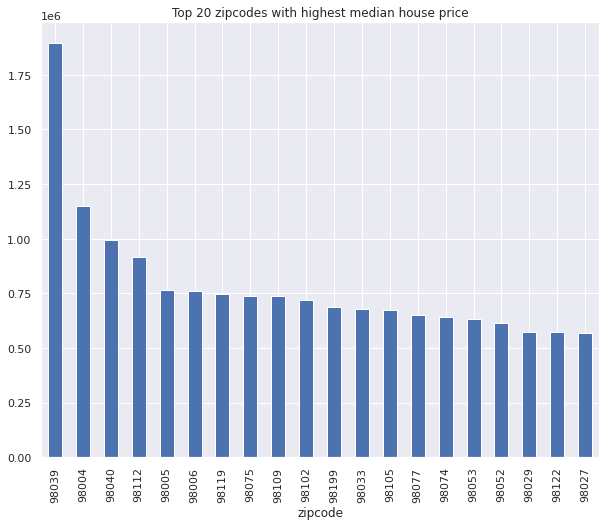

In [ ]:
temp = House['price'].groupby([House['zipcode']]).median()
temp = temp.sort_values(ascending=False)[:20]
temp.plot(kind='bar',figsize=(10,8), title='Top 20 zipcodes with highest median house price')
plt.show()

>Scatter plots

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

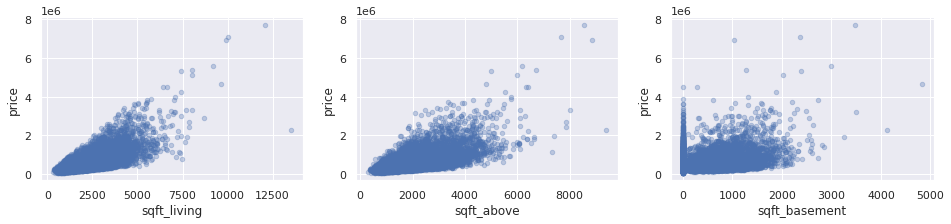

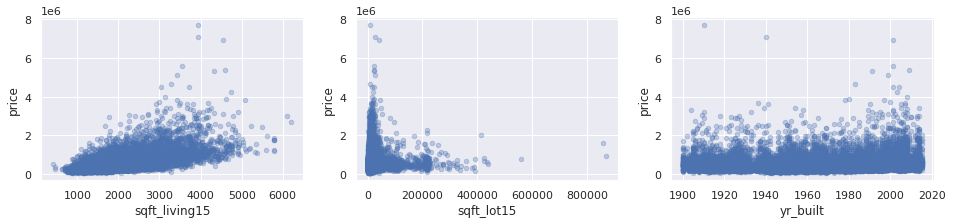

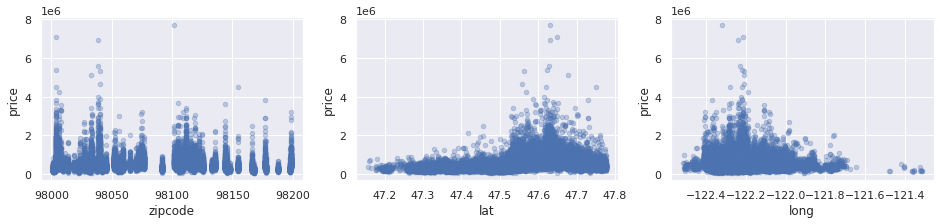

In [ ]:
#Plotting potential continuous variables

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3))
con_list = ['sqft_living','sqft_above','sqft_basement']

for xcol, ax in zip(con_list, axes):
    House.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.3)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3))
con_list2 =['sqft_living15','sqft_lot15','yr_built']

for xcol, ax in zip(con_list2, axes):
    House.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.3)
    
#Plotting zipcode

fig, axes = plt.subplots(nrows=1,ncols=3, figsize=(16,3))
geo_list = ['zipcode','lat','long']

for xcol, ax in zip(geo_list, axes):
   House.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.3)

 From the scattered plots above, we can tell sqft_living, sqft_above, sqft_living15 have positive correlation with house price, while yr_built and zipcode do not have obvious relationship with house price. Also from the plot, we can tell that the shape of sqft_living and sqft_living15 are similar while sqft_lot and sqft_lot15 are very similar too. So probably these two sets of variables are highly correlated.

>Scatter plots

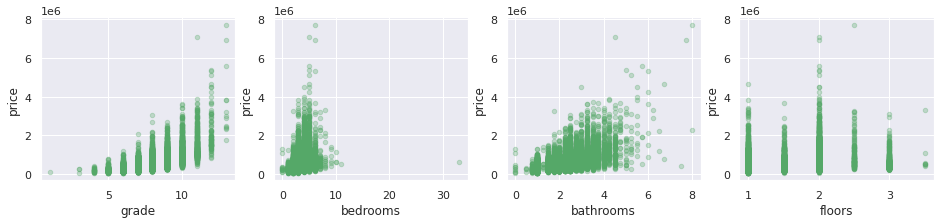

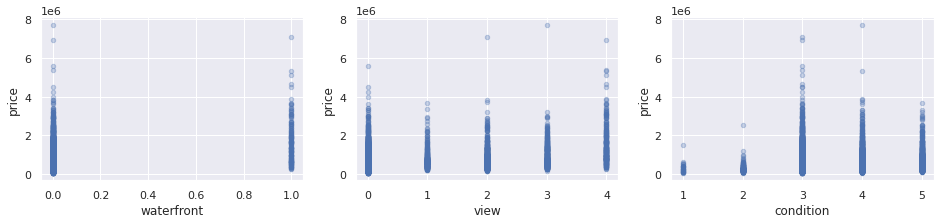

In [ ]:
#Plotting other variables. Waterfront is clearly categorical values with binominal values. 
#While view, condition, grade, bedrooms, bathrooms, and floors present actual numerical values so we can either keep them numerical or transform them into categorical values. 

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16,3))
cat_list1 = ['grade','bedrooms', 'bathrooms','floors']


for xcol, ax in zip(cat_list1, axes):
    House.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.3, color='g')

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3))    
cat_list2=['waterfront', 'view', 'condition']
for xcol, ax in zip(cat_list2, axes):
   House.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.3, color='b')

>Correlation

In [ ]:
#check for correlation
House.corr(method ='kendall')
# columns have either strong,weak nor no relationship at all with each other

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,0.003200,0.004851,0.010558,0.001175,-0.078533,0.014683,-0.002915,0.010216,-0.018863,0.014861,0.002346,0.001079,0.018013,-0.013955,-0.003795,-0.002590,0.004324,0.000053,-0.077261
price,0.003200,1.000000,0.265110,0.369215,0.463601,0.047226,0.251595,0.094077,0.237588,0.014489,0.527818,0.378210,0.190438,0.070312,0.082339,-0.009781,0.292911,0.039816,0.405014,0.038416
bedrooms,0.004851,0.265110,1.000000,0.439516,0.521357,0.164670,0.201783,-0.007075,0.074449,0.011325,0.330793,0.429259,0.196802,0.141458,0.015325,-0.127757,-0.015624,0.144278,0.346039,0.153048
bathrooms,0.010558,0.369215,0.439516,1.000000,0.588210,0.049924,0.450952,0.043066,0.133156,-0.137470,0.556459,0.530554,0.153246,0.428907,0.036815,-0.143591,0.005435,0.187420,0.430075,0.045559
sqft_living,0.001175,0.463601,0.521357,0.588210,1.000000,0.206643,0.316279,0.057526,0.187760,-0.049791,0.586434,0.697140,0.266244,0.244689,0.042553,-0.138091,0.020360,0.191605,0.570251,0.192458
sqft_lot,-0.078533,0.047226,0.164670,0.049924,0.206643,1.000000,-0.186344,0.069937,0.094127,0.090144,0.111763,0.185693,0.028118,-0.005112,0.006862,-0.205289,-0.080596,0.258163,0.244186,0.792362
floors,0.014683,0.251595,0.201783,0.450952,0.316279,-0.186344,1.000000,0.022818,0.018352,-0.265355,0.435384,0.475380,-0.235989,0.417275,0.011711,-0.049645,0.019368,0.115329,0.239870,-0.183783
waterfront,-0.002915,0.094077,-0.007075,0.043066,0.057526,0.069937,0.022818,1.000000,0.280223,0.016214,0.056818,0.044597,0.047104,-0.023490,0.090774,0.024363,-0.015551,-0.031174,0.061029,0.075405
view,0.010216,0.237588,0.074449,0.133156,0.187760,0.094127,0.018352,0.280223,1.000000,0.043627,0.195495,0.116235,0.211565,-0.053629,0.093321,0.063349,-0.000167,-0.082917,0.206488,0.093679
condition,-0.018863,0.014489,0.011325,-0.137470,-0.049791,0.090144,-0.265355,0.016214,0.043627,1.000000,-0.148791,-0.125823,0.141928,-0.319012,-0.063725,-0.018607,-0.017670,-0.068152,-0.069275,0.092446


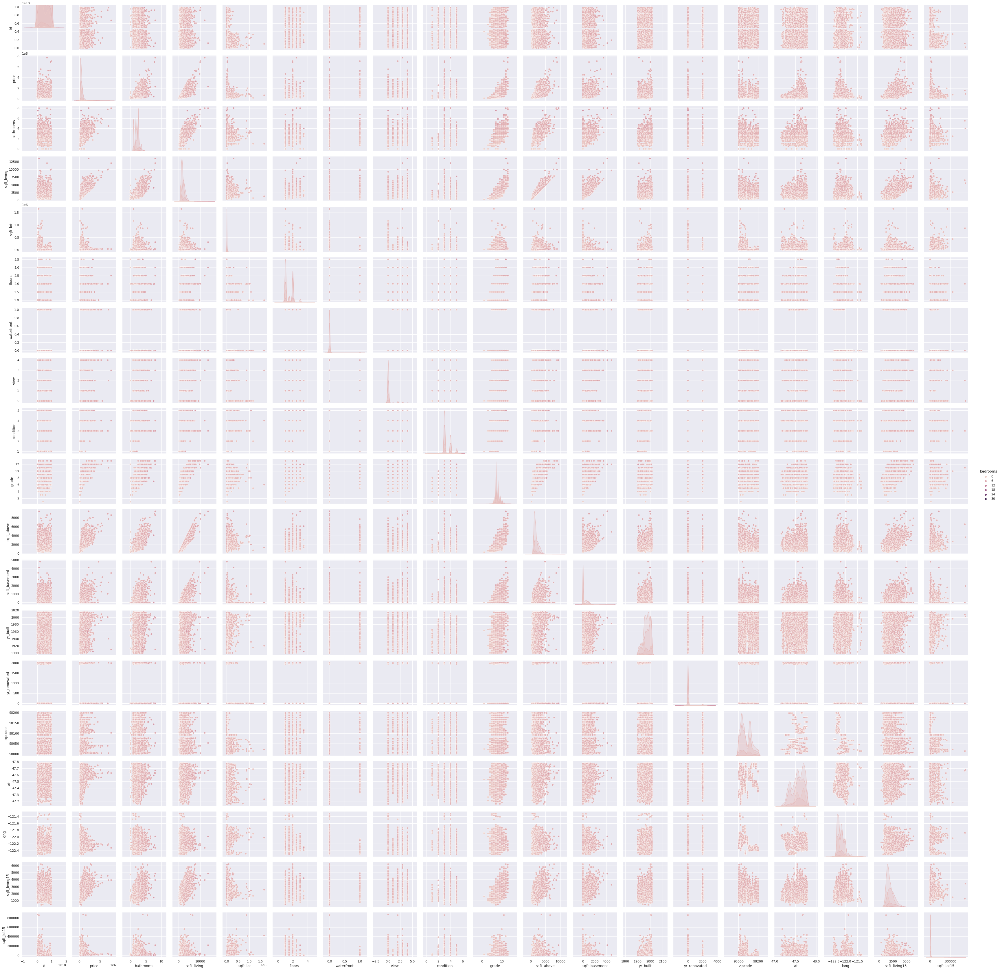

In [ ]:
sns.pairplot(House,hue = 'bedrooms')

In [ ]:
# Calculating the pearson coefficient
House.corr() 

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,-0.016803,0.001354,0.005093,-0.012239,-0.132101,0.018482,-0.002717,0.011785,-0.023686,0.008093,-0.010857,-0.005084,0.021218,-0.016688,-0.008129,-0.001861,0.020776,-0.002869,-0.138778
price,-0.016803,1.000000,0.308346,0.525140,0.702046,0.089658,0.256793,0.266332,0.397466,0.036397,0.667478,0.605569,0.323849,0.053980,0.126503,-0.053162,0.306922,0.021567,0.585382,0.082457
bedrooms,0.001354,0.308346,1.000000,0.515935,0.576674,0.031699,0.175448,-0.006583,0.079433,0.028422,0.357003,0.477619,0.303077,0.154276,0.018695,-0.152721,-0.008953,0.129474,0.391633,0.029233
bathrooms,0.005093,0.525140,0.515935,1.000000,0.754688,0.087750,0.500669,0.063747,0.187891,-0.124940,0.664990,0.685351,0.283814,0.505997,0.050879,-0.203831,0.024590,0.223047,0.568665,0.087191
sqft_living,-0.012239,0.702046,0.576674,0.754688,1.000000,0.172830,0.353954,0.103820,0.284641,-0.058768,0.762719,0.876600,0.435054,0.318099,0.055314,-0.199435,0.052521,0.240221,0.756420,0.183285
sqft_lot,-0.132101,0.089658,0.031699,0.087750,0.172830,1.000000,-0.005171,0.021601,0.074753,-0.008967,0.113644,0.183527,0.015271,0.053105,0.007677,-0.129611,-0.085680,0.229552,0.144620,0.718556
floors,0.018482,0.256793,0.175448,0.500669,0.353954,-0.005171,1.000000,0.023711,0.029325,-0.263779,0.458151,0.523874,-0.245673,0.489347,0.006156,-0.059025,0.049593,0.125343,0.279861,-0.011250
waterfront,-0.002717,0.266332,-0.006583,0.063747,0.103820,0.021601,0.023711,1.000000,0.401993,0.016652,0.082785,0.072080,0.080585,-0.026159,0.092950,0.030277,-0.014272,-0.041904,0.086469,0.030702
view,0.011785,0.397466,0.079433,0.187891,0.284641,0.074753,0.029325,0.401993,1.000000,0.045836,0.251378,0.167659,0.276996,-0.053229,0.103208,0.084838,0.006049,-0.078560,0.280404,0.072577
condition,-0.023686,0.036397,0.028422,-0.124940,-0.058768,-0.008967,-0.263779,0.016652,0.045836,1.000000,-0.144655,-0.158212,0.174071,-0.361347,-0.060862,0.002962,-0.014971,-0.106512,-0.092854,-0.003424


Text(0.5, 1.0, 'Heatmap showing Correlation of the Numerical Columns')

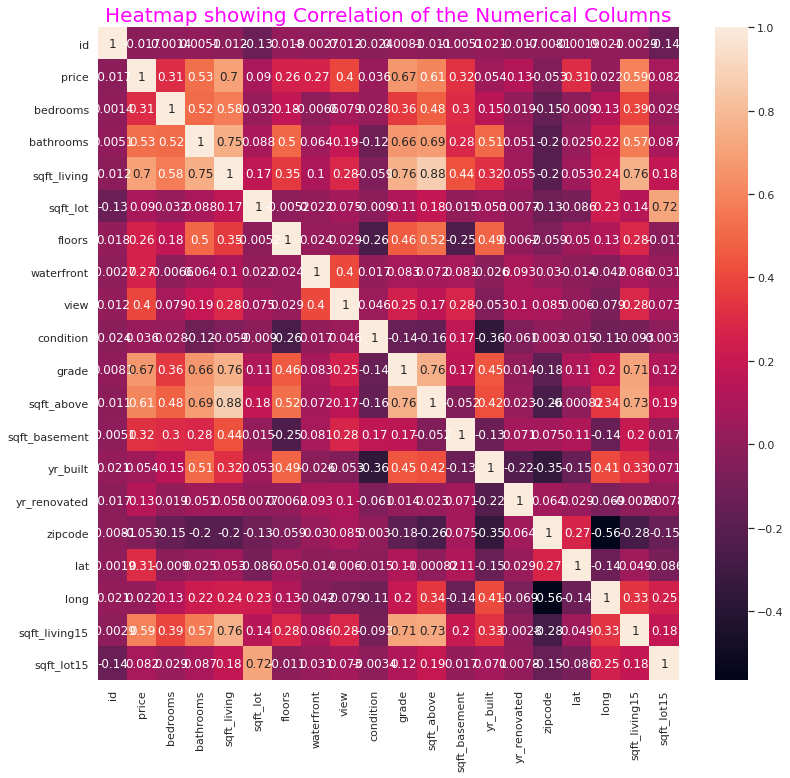

In [ ]:
# heatmap to visualise features with linear relationships 
plt.figure(figsize = (13, 12))
sns.heatmap(House.corr(), annot=True, );
plt.title('Heatmap showing Correlation of the Numerical Columns', color = 'magenta', fontsize = 20)

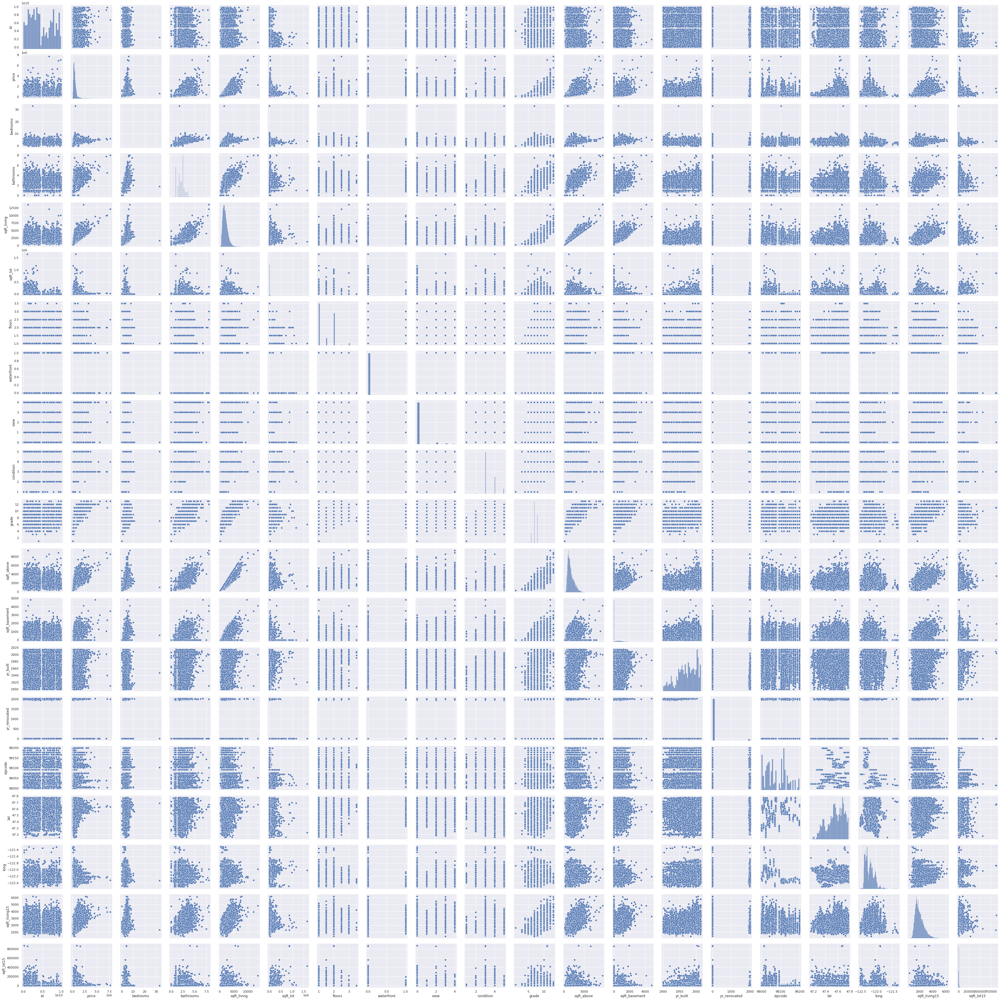

In [ ]:
# Creating a pairplot to build histograms and scatter plots.
# The histogram on the diagonal shows the distribution of a single variable
# while the scatter plots on the upper and lower triangles show the relationship (or lack thereof) between two variables.

sns.pairplot(House)
plt.show()

>Multivariate Analysis

In [ ]:
# Installing factor analyzer 
!pip install factor_analyzer==0.2.3

In [ ]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
df1 = House.drop(['id'], axis='columns')
chi_square_value,p_value=calculate_bartlett_sphericity(df1)
chi_square_value, p_value

(834504.6195418446, 0.0)

In Bartlett ’s test, the p-value is 0. The test was statistically significant, indicating that the observed correlation matrix is not an identity matrix

In [ ]:
from factor_analyzer.factor_analyzer import calculate_kmo

kmo_all,kmo_model=calculate_kmo(df1)
kmo_model

0.7421021130209837

The overall KMO for our data is 0.74, which is not that bad. This value indicates that you can proceed with your planned factor analysis.

In [ ]:
#Choosing the Number of Factors

# Creating factor analysis object and perform factor analysis
from factor_analyzer.factor_analyzer import FactorAnalyzer
fa = FactorAnalyzer()
fa.analyze(df1, 5, rotation=None)

# Checking the Eigenvalues
ev, v = fa.get_eigenvalues()
ev

,Original_Eigenvalues
0,5.675512e+00
1,2.414944e+00
2,1.845060e+00
3,1.377913e+00
4,1.206663e+00
5,1.006692e+00
6,9.367768e-01
7,8.366971e-01
8,6.607254e-01
9,6.011649e-01


In [ ]:
# Creating factor analysis object and perform factor analysis
#
fa = FactorAnalyzer()
fa.analyze(df1, 9, rotation="varimax")
fa.loadings


,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9
price,0.614096,0.065322,0.047110,0.047891,0.054695,0.404010,-0.075034,0.645856,0.098760
bedrooms,0.607100,0.047317,-0.023611,0.176472,0.012025,-0.058853,-0.068477,-0.103410,0.114459
bathrooms,0.755526,0.089766,0.023697,0.177617,0.023295,0.080093,0.321150,0.022677,0.268283
sqft_living,0.939190,0.079985,0.117035,0.194892,0.019618,0.130291,0.062251,0.082579,-0.056682
sqft_lot,0.072236,0.078395,0.846273,-0.000907,0.003264,0.032773,-0.003244,-0.027540,0.022188
floors,0.413553,-0.035433,-0.040743,-0.276226,0.000281,0.021855,0.505176,0.065902,0.229470
waterfront,0.028174,-0.008009,0.010033,-0.010541,0.041856,0.547368,-0.017157,0.012249,0.045405
view,0.184190,-0.091799,0.050458,0.125737,0.025722,0.723552,-0.038008,0.004671,-0.085822
condition,-0.036773,0.006009,-0.005575,0.089956,-0.066602,0.040792,-0.465205,-0.004261,0.070370
grade,0.722493,0.114963,0.059762,0.020015,-0.025202,0.169867,0.308323,0.275222,-0.070803


In [ ]:
#Getting variance of each factors
# 
fa.get_factor_variance()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9
SS Loadings,4.483096,1.395454,1.507286,1.107091,1.041288,1.122174,1.439339,0.825708,0.290570
Proportion Var,0.235952,0.073445,0.079331,0.058268,0.054805,0.059062,0.075755,0.043458,0.015293
Cumulative Var,0.235952,0.309397,0.388728,0.446996,0.501801,0.560863,0.636617,0.680076,0.695369


69% cumulative Variance is explained by the 9 factors.

>Multiple regression analysis

In [ ]:
# Using multiple regression method to find out which features influence the usage of a specific postal code
# Using confidence level and significance level, the relationship between the feature and the response can be determined
# A predictor (an independent variable) that has a low p-value is likely to be a meaningful addition to the model because changes in the predictor's value 
# are related to changes in the response variable. Conversely, a larger (insignificant) p-value suggests that changes 
# in the predictor are not associated with changes in the response.

# Splitting the dataset into X and y
X = house.drop(['id', 'price'], axis =1)
y = house['price'].astype('int')



# Standardising the X values to the same scale
sc = StandardScaler()
X = sc.fit_transform(house)
import statsmodels.api as sm
# Applying the OLS model from statsmodel library
X2 = sm.add_constant(X)
model = sm.OLS(y, X2).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.001e+31
Date:                Sat, 21 Nov 2020   Prob (F-statistic):               0.00
Time:                        15:28:45   Log-Likelihood:             2.8047e+05
No. Observations:               14935   AIC:                        -5.609e+05
Df Residuals:                   14917   BIC:                        -5.608e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.387e+05   1.38e-11   3.17e+16      0.0

From the above table, it can be seen that the R2 score is 1.0%; this means that the model can predict with 1.0% accuracy 

## 10. Implementing the Solution

>Checking for Multi-collinearity

In [27]:
# Displaying the correlations between the variables
#
corrs = House.drop(['id','price'], axis = 1).corr()
corrs

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
bedrooms,1.000000,0.515935,0.576674,0.031699,0.175448,-0.006583,0.079433,0.028422,0.357003,0.477619,0.303077,0.154276,0.018695,-0.152721,-0.008953,0.129474,0.391633,0.029233
bathrooms,0.515935,1.000000,0.754688,0.087750,0.500669,0.063747,0.187891,-0.124940,0.664990,0.685351,0.283814,0.505997,0.050879,-0.203831,0.024590,0.223047,0.568665,0.087191
sqft_living,0.576674,0.754688,1.000000,0.172830,0.353954,0.103820,0.284641,-0.058768,0.762719,0.876600,0.435054,0.318099,0.055314,-0.199435,0.052521,0.240221,0.756420,0.183285
sqft_lot,0.031699,0.087750,0.172830,1.000000,-0.005171,0.021601,0.074753,-0.008967,0.113644,0.183527,0.015271,0.053105,0.007677,-0.129611,-0.085680,0.229552,0.144620,0.718556
floors,0.175448,0.500669,0.353954,-0.005171,1.000000,0.023711,0.029325,-0.263779,0.458151,0.523874,-0.245673,0.489347,0.006156,-0.059025,0.049593,0.125343,0.279861,-0.011250
waterfront,-0.006583,0.063747,0.103820,0.021601,0.023711,1.000000,0.401993,0.016652,0.082785,0.072080,0.080585,-0.026159,0.092950,0.030277,-0.014272,-0.041904,0.086469,0.030702
view,0.079433,0.187891,0.284641,0.074753,0.029325,0.401993,1.000000,0.045836,0.251378,0.167659,0.276996,-0.053229,0.103208,0.084838,0.006049,-0.078560,0.280404,0.072577
condition,0.028422,-0.124940,-0.058768,-0.008967,-0.263779,0.016652,0.045836,1.000000,-0.144655,-0.158212,0.174071,-0.361347,-0.060862,0.002962,-0.014971,-0.106512,-0.092854,-0.003424
grade,0.357003,0.664990,0.762719,0.113644,0.458151,0.082785,0.251378,-0.144655,1.000000,0.755919,0.168443,0.446966,0.014372,-0.184795,0.114086,0.198347,0.713208,0.119265
sqft_above,0.477619,0.685351,0.876600,0.183527,0.523874,0.072080,0.167659,-0.158212,0.755919,1.000000,-0.051923,0.423922,0.023233,-0.261163,-0.000823,0.343791,0.731870,0.194060



The tabe above shows how each variable relates to another. The coefficient of 1 across the diagonal makes sense, as a variable is perfectly correlated to itself. The correlations have been used to compute the VIF (Variance Inflation Factor) value for each variable.The VIF is created by finding the inverse matrix of the correations matrix.

In [28]:
# Creating a dataframe of the VIF
#
vif_df = pd.DataFrame(np.linalg.inv(corrs.values), index = corrs.index, columns = corrs.columns)
vif_df

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
bedrooms,1.652159,-0.461426,-6.131806e-01,0.049327,0.049848,0.063078,0.114430,-0.050633,0.306941,-3.237657e-01,-1.881523e-01,0.134509,0.045800,0.080174,0.050839,0.017554,0.025284,0.085416
bathrooms,-0.461426,3.351248,-3.146032e+00,-0.024033,-0.675409,0.010097,-0.042387,-0.137265,-0.267927,1.566362e+00,4.385015e-01,-0.935745,-0.260436,0.041789,-0.041080,0.053741,0.092020,0.071444
sqft_living,-0.614125,-3.147527,1.814600e+13,-0.083836,2.725995,-0.075267,-0.010738,-0.174659,-1.942256,-1.636081e+13,-8.743992e+12,0.465511,0.157235,-0.351953,-0.055686,0.225522,-1.068731,-0.050464
sqft_lot,0.049327,-0.024033,-8.472318e-02,2.102526,0.045181,0.027369,-0.059109,0.030522,-0.053865,-1.229640e-01,-1.799981e-03,0.098734,0.021295,-0.002580,0.053339,-0.133206,0.163933,-1.459308
floors,0.049848,-0.675409,2.727895e+00,0.045181,2.011974,-0.005524,-0.040067,0.089832,-0.230827,-2.964235e+00,-6.995572e-01,-0.481324,-0.079986,-0.170816,-0.127521,0.164281,0.272632,0.072657
waterfront,0.063078,0.010097,-7.563028e-02,0.027369,-0.005524,1.203970,-0.492855,-0.012820,0.049272,-4.380875e-02,3.280588e-02,-0.021102,-0.065851,0.022562,0.009815,0.027241,0.054397,-0.018480
view,0.114430,-0.042387,-9.767467e-03,-0.059109,-0.040067,-0.492855,1.435320,-0.021126,-0.185270,4.816459e-02,-2.516918e-01,0.151685,-0.039119,-0.140639,0.118633,0.071934,-0.325388,-0.007469
condition,-0.050633,-0.137265,-1.749044e-01,0.030522,0.089832,-0.012820,-0.021126,1.249500,-0.054508,2.132228e-01,-1.323553e-02,0.561510,0.206913,0.161279,0.063727,-0.006876,0.075908,-0.028242
grade,0.306941,-0.267927,-1.945115e+00,-0.053865,-0.230827,0.049272,-0.185270,-0.054508,3.416981,1.441457e-01,4.510090e-01,-0.638907,-0.071472,0.083155,-0.330860,0.393716,-0.911600,0.071863
sqft_above,-0.321458,1.564793,-1.636081e+13,-0.123737,-2.962207,-0.044143,0.049025,0.212984,0.141509,1.475124e+13,7.883763e+12,0.100178,-0.142897,0.241689,0.231229,-0.545073,-0.572072,-0.130215


In [36]:
##### correlation
cor=House.drop(['id','waterfront','view','yr_renovated','lat','zipcode','long'],axis=1).corr()
cor

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,sqft_living15,sqft_lot15
price,1.000000,0.308346,0.525140,0.702046,0.089658,0.256793,0.036397,0.667478,0.605569,0.323849,0.053980,0.585382,0.082457
bedrooms,0.308346,1.000000,0.515935,0.576674,0.031699,0.175448,0.028422,0.357003,0.477619,0.303077,0.154276,0.391633,0.029233
bathrooms,0.525140,0.515935,1.000000,0.754688,0.087750,0.500669,-0.124940,0.664990,0.685351,0.283814,0.505997,0.568665,0.087191
sqft_living,0.702046,0.576674,0.754688,1.000000,0.172830,0.353954,-0.058768,0.762719,0.876600,0.435054,0.318099,0.756420,0.183285
sqft_lot,0.089658,0.031699,0.087750,0.172830,1.000000,-0.005171,-0.008967,0.113644,0.183527,0.015271,0.053105,0.144620,0.718556
floors,0.256793,0.175448,0.500669,0.353954,-0.005171,1.000000,-0.263779,0.458151,0.523874,-0.245673,0.489347,0.279861,-0.011250
condition,0.036397,0.028422,-0.124940,-0.058768,-0.008967,-0.263779,1.000000,-0.144655,-0.158212,0.174071,-0.361347,-0.092854,-0.003424
grade,0.667478,0.357003,0.664990,0.762719,0.113644,0.458151,-0.144655,1.000000,0.755919,0.168443,0.446966,0.713208,0.119265
sqft_above,0.605569,0.477619,0.685351,0.876600,0.183527,0.523874,-0.158212,0.755919,1.000000,-0.051923,0.423922,0.731870,0.194060
sqft_basement,0.323849,0.303077,0.283814,0.435054,0.015271,-0.245673,0.174071,0.168443,-0.051923,1.000000,-0.133062,0.200367,0.017260


In [31]:
# Creating a dataframe of the VIF
#
vif_df1 = pd.DataFrame(np.linalg.inv(cor.values), index = cor.index, columns = cor.columns)
vif_df1

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,sqft_living15,sqft_lot15
price,2.631212,0.328985,-0.276323,-6.986562e-01,-0.003196,-0.129764,-0.088617,-1.050077,-3.568254e-01,-2.828687e-01,0.835597,-0.178158,0.099012
bedrooms,0.328985,1.662985,-0.480301,-6.671751e-01,0.047013,0.064962,-0.082170,0.214129,-3.992196e-01,-1.952545e-01,0.154077,0.012897,0.097391
bathrooms,-0.276323,-0.480301,3.317084,-3.031033e+00,-0.017517,-0.683788,-0.083450,-0.193834,1.572203e+00,4.301467e-01,-0.886688,0.122269,0.058866
sqft_living,-0.704429,-0.667055,-3.032375,1.808269e+13,-0.046162,2.640392,-0.118280,-1.770546,-1.630373e+13,-8.713486e+12,0.430367,-0.896666,-0.035009
sqft_lot,-0.003196,0.047013,-0.017517,-4.724752e-02,2.085975,0.072932,0.017098,-0.011094,-1.886092e-01,-7.085016e-03,0.026883,0.117259,-1.474296
floors,-0.129764,0.064962,-0.683788,2.639077e+00,0.072932,1.931682,0.146720,-0.286161,-2.770118e+00,-6.942490e-01,-0.306531,0.358621,0.094234
condition,-0.088617,-0.082170,-0.083450,-1.183137e-01,0.017098,0.146720,1.191373,0.025452,1.754545e-01,5.279876e-03,0.363311,0.028591,-0.036081
grade,-1.050077,0.214129,-0.193834,-1.780117e+00,-0.011094,-0.286161,0.025452,3.627244,5.202298e-01,5.119708e-01,-0.683691,-0.790244,0.079214
sqft_above,-0.352880,-0.400892,1.573635,-1.630373e+13,-0.189500,-2.771055,0.175366,0.511768,1.469977e+13,7.856258e+12,-0.345180,-0.728358,-0.221801
sqft_basement,-0.279609,-0.195135,0.430532,-8.713486e+12,-0.007516,-0.694350,0.005200,0.507489,7.856258e+12,4.198757e+12,0.011525,0.010068,-0.046100


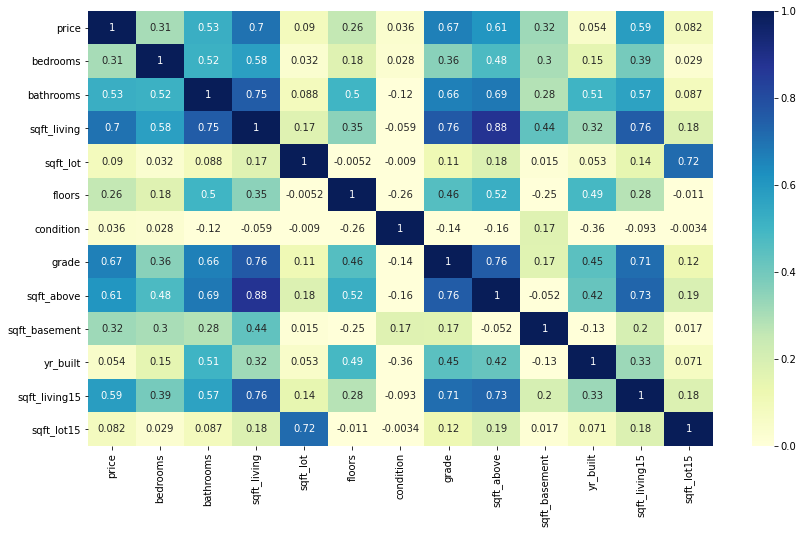

In [34]:
#computing the VIF(which is the inverse of the correlation matrix)
plt.figure(figsize=(14,8))
sns.heatmap(cor,annot=True,cmap="YlGnBu",vmax=1,vmin=0)

The heat map above shows VIF values that are very close to 0 meaning that there is very little multi-collinearity

## Quantile Regression

In [37]:
!pip3 install mod

In [ ]:
#
X = scaled_df.iloc[:,2:21]
y = scaled_df.iloc[:,:1]

scaler = StandardScaler()
scaler.fit(X)

X = scaler.fit_transform(X)


## non constant error
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)

## Creating a linear regression model regression on the above dataset
#
from sklearn.linear_model import LinearRegression



##  now trying to fit a linear regression
# 
model2 = LinearRegression(fit_intercept = True, normalize = False)
model2.fit(X, y)

y_pred2 = model2.predict(X)



# With a low variance score of 0.51, it means that our linear regression 
# did not do a good job. 
# Our dataframe data has two columns, ‘x’ and ‘y’
#


# We will use the python package statsmodels for Quantile Regression
#
import statsmodels.formula.api as smf

# Finding the regression coefficients for the conditioned median, 0.5 quantile
#
mod = smf.quantreg
res = mod.fit(q=.5)

# Then print out the summary of our model
#
print(res.summary())

In [ ]:
# Creating X and y variables
#
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]

scaler = StandardScaler()
scaler.fit(X)

X = scaler.fit_transform(X)



# Splitting the dataset into training and testing sets
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)

# We will use the python package statsmodels for Quantile Regression
#
import statsmodels.formula.api as smf

# Finding the regression coefficients for the conditioned median, 0.5 quantile
#

quantiles =np.arange(0.1,1,0.1)

for qt in quantiles:
  res = mod.fit(q =qt)

print(res.summary())

In [ ]:
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]
# Encoding categorical variables
#
# Scaling data 
#
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)
#with sklearn
regr = linear_model.LinearRegression()
regr.fit(X, y)
quantiles = np.arange(0.1,1,0.1) 
for qt in quantiles: 
	res = mod.fit(q = qt )
print('Quatile: \n', regr.qt_)
print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

import statsmodels.api as sm

# with statsmodels
X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(y, X).fit()
predictions = model.predict(X) 
 
print_model = model.summary()
print(print_model)


##  Ridge Regression

In [47]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [ ]:
# installing !pip install pydataset and importing pydataset so as to use a dataset from the package
# 
!pip install pydataset
from pydataset import data 

     |████████████████████████████████| 15.9MB 313kB/s 
  Created wheel for pydataset: filename=pydataset-0.2.0-cp36-none-any.whl size=15939431 sha256=61b59eb5839cbd404922655083a20df145b8c87b5697cb68112d370aaf4b0237
  Stored in directory: /root/.cache/pip/wheels/fe/3f/dc/5d02ccc767317191b12d042dd920fcf3432fab74bc7978598b
Successfully built pydataset
initiated datasets repo at: /root/.pydataset/


In [59]:
from sklearn import preprocessing
import pandas as pd
names = House.columns
d = preprocessing.normalize(House)
scaled_df1 = pd.DataFrame(d, columns=names)
scaled_df1.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,1.0,0.000031,4.207986e-10,1.402662e-10,1.655141e-07,7.925041e-07,1.402662e-10,0.0,0.0,4.207986e-10,9.818635e-10,1.655141e-07,0.000000e+00,2.742205e-07,0.000000e+00,0.000014,6.664216e-09,-1.714853e-08,1.879567e-07,7.925041e-07
1,1.0,0.000084,4.677195e-10,3.507897e-10,4.006797e-07,1.129075e-06,3.118130e-10,0.0,0.0,4.677195e-10,1.091346e-09,3.383171e-07,6.236261e-08,3.041736e-07,3.104099e-07,0.000015,7.440015e-09,-1.907033e-08,2.634820e-07,1.190970e-06
2,1.0,0.000032,3.551451e-10,1.775726e-10,1.367309e-07,1.775726e-06,1.775726e-10,0.0,0.0,5.327177e-10,1.065435e-09,1.367309e-07,0.000000e+00,3.432478e-07,0.000000e+00,0.000017,8.476942e-09,-2.170523e-08,4.829974e-07,1.431590e-06
3,1.0,0.000243,1.608234e-09,1.206175e-09,7.880344e-07,2.010292e-06,4.020584e-10,0.0,0.0,2.010292e-09,2.814409e-09,4.221613e-07,3.658731e-07,7.900447e-07,0.000000e+00,0.000039,1.910614e-08,-4.920913e-08,5.467994e-07,2.010292e-06
4,1.0,0.000261,1.534997e-09,1.023332e-09,8.595986e-07,4.134260e-06,5.116658e-10,0.0,0.0,1.534997e-09,4.093327e-09,8.595986e-07,0.000000e+00,1.016680e-06,0.000000e+00,0.000050,2.436389e-08,-6.244626e-08,9.209985e-07,3.839029e-06


In [60]:
scaled_df1.drop(columns=['id'], inplace=True)
scaled_df1

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0.000031,4.207986e-10,1.402662e-10,1.655141e-07,7.925041e-07,1.402662e-10,0.0,0.0,4.207986e-10,9.818635e-10,1.655141e-07,0.000000e+00,2.742205e-07,0.000000e+00,0.000014,6.664216e-09,-1.714853e-08,1.879567e-07,7.925041e-07
1,0.000084,4.677195e-10,3.507897e-10,4.006797e-07,1.129075e-06,3.118130e-10,0.0,0.0,4.677195e-10,1.091346e-09,3.383171e-07,6.236261e-08,3.041736e-07,3.104099e-07,0.000015,7.440015e-09,-1.907033e-08,2.634820e-07,1.190970e-06
2,0.000032,3.551451e-10,1.775726e-10,1.367309e-07,1.775726e-06,1.775726e-10,0.0,0.0,5.327177e-10,1.065435e-09,1.367309e-07,0.000000e+00,3.432478e-07,0.000000e+00,0.000017,8.476942e-09,-2.170523e-08,4.829974e-07,1.431590e-06
3,0.000243,1.608234e-09,1.206175e-09,7.880344e-07,2.010292e-06,4.020584e-10,0.0,0.0,2.010292e-09,2.814409e-09,4.221613e-07,3.658731e-07,7.900447e-07,0.000000e+00,0.000039,1.910614e-08,-4.920913e-08,5.467994e-07,2.010292e-06
4,0.000261,1.534997e-09,1.023332e-09,8.595986e-07,4.134260e-06,5.116658e-10,0.0,0.0,1.534997e-09,4.093327e-09,8.595986e-07,0.000000e+00,1.016680e-06,0.000000e+00,0.000050,2.436389e-08,-6.244626e-08,9.209985e-07,3.839029e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21605,0.001369,1.140683e-08,9.505693e-09,5.817484e-06,4.300376e-06,1.140683e-08,0.0,0.0,1.140683e-08,3.041822e-08,5.817484e-06,0.000000e+00,7.638775e-06,0.000000e+00,0.000373,1.813660e-07,-4.651934e-07,5.817484e-06,5.737636e-06
21606,0.000061,6.060551e-10,3.787844e-10,3.499968e-07,8.807496e-07,3.030275e-10,0.0,0.0,4.545413e-10,1.212110e-09,3.499968e-07,0.000000e+00,3.051487e-07,0.000000e+00,0.000015,7.198525e-09,-1.853953e-08,2.772702e-07,1.090899e-06
21607,0.000264,1.312939e-09,4.923521e-10,6.695988e-07,8.862337e-07,1.312939e-09,0.0,0.0,1.969408e-09,4.595286e-09,6.695988e-07,0.000000e+00,1.318847e-06,0.000000e+00,0.000064,3.124427e-08,-8.028555e-08,6.695988e-07,1.317534e-06
21608,0.001373,1.029829e-08,8.581912e-09,5.492423e-06,8.197442e-06,6.865529e-09,0.0,0.0,1.029829e-08,2.746212e-08,5.492423e-06,0.000000e+00,6.879260e-06,0.000000e+00,0.000337,1.631747e-07,-4.190341e-07,4.840198e-06,4.417968e-06


In [ ]:

scaled_df.drop(columns=['id'], inplace=True)
scaled_df

In [ ]:
# Selecting the relevant features for the logistic regression model
#
dataset = house[['bedrooms','bathrooms','sqft_living','sqft_lot','floors','condition','grade','sqft_above','sqft_basement','yr_built','yr_renovated','sqft_living15','sqft_lot15','price']]


# Previewing the first five rows of the data
#
dataset.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15,price
0,3,1.00,1180,5650,1.0,3,7,1180,0,1955,0,1340,5650,221900.0
2,2,1.00,770,10000,1.0,3,6,770,0,1933,0,2720,8062,180000.0
3,4,3.00,1960,5000,1.0,5,7,1050,910,1965,0,1360,5000,604000.0
4,3,2.00,1680,8080,1.0,3,8,1680,0,1987,0,1800,7503,510000.0
6,3,2.25,1715,6819,2.0,3,7,1715,0,1995,0,2238,6819,257500.0


In [ ]:
### dimension reduction using PCA
from sklearn.decomposition import PCA
pca=PCA(n_components=4)
x_train=pca.fit_transform(x_train)
x_test=pca.transform(x_test)

>Creating the model

In [ ]:
# Creating X and y variables
#
X = dataset.iloc[:,:13]
y = dataset.iloc[:,13:]

scaler = StandardScaler()
scaler.fit(X)

X = scaler.fit_transform(X)



# Splitting the dataset into training and testing sets
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)

#
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Training the model
#
ridge = Ridge(normalize=True)
ridge.fit(X_train, y_train)

# Making predictions
#
y_pred = ridge.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of Ridge: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of Ridge: 142434.56720748977
Mean of y: 438658.2108470037


In [63]:
# Creating X and y variables
#
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]


# Splitting the dataset into training and testing sets
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)

#
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Training the model
#
ridge = Ridge(normalize=True)
ridge.fit(X_train, y_train)

# Making predictions
#
y_pred = ridge.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of Ridge: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of Ridge: 0.003434770627305631
Mean of y: 0.0004813971211222601


>Hyperparameter tuning to find the optimal parameters for the model

In [ ]:
# Tuning the alpha parameter
# Creating a parameters dictionary
#
params = {'alpha': np.logspace(-5, 2, 8)}



# Creating a cross validation of 10 folds
#
kfold = KFold(n_splits = 10)

# Using grid search to find the optimal parameters
#
grid_search = GridSearchCV(estimator=Ridge(normalize = True), param_grid = params, cv = kfold, scoring = 'neg_mean_squared_error')

# Fitting the grid search 
#
grid_search_results = grid_search.fit(X, y)

# Displaying the best parameters and the the best score
#
print(f'Best score is {np.sqrt(grid_search.best_score_*-1)} and the best parameters are {grid_search.best_params_}')



Best score is 127637.10294487078 and the best parameters are {'alpha': 0.01}


>Training the model with optimal parameters

In [ ]:
# Training the model with the optimal alpha value
#
ridge = Ridge(normalize=True, alpha = 1e-05)
ridge.fit(X_train, y_train)

# Making predictions
#
y_pred = ridge.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of Ridge: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')


RMSE of Ridge: 129923.3974798172
Mean of y: 438658.2108470037


Performing cross validation to check for overfitting or underfitting

In [ ]:
# Performing cross validation of ten folds
#
scores = cross_val_score(ridge, X, y, scoring = 'neg_mean_squared_error', cv = 10)

# Calculating the mean of the cross validation scores
#
print(f'Mean of cross validation scores is {np.sqrt(np.round(scores.mean()*-1, 3))}')

# Calculating the variance of the cross validation scores from the mean
#
print(f'Standard deviation of the cross validation scores is {np.round(scores.std(), 3)}')

Mean of cross validation scores is 127641.22413437204
Standard deviation of the cross validation scores is 638029875.588


Checking the appripriateness of the model using a residual plot

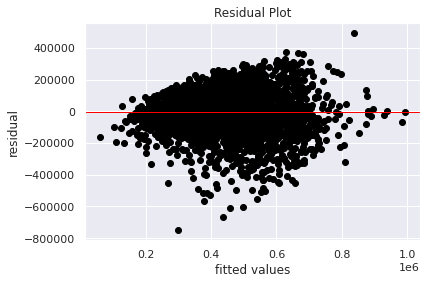

In [ ]:
# Residuals have been calculated by by substracting the test value from the predicted value
# 
residuals = np.subtract(y_pred, y_test)

# Plotting the residual scatterplot
#
plt.scatter(y_pred, residuals, color='black')
plt.title('Residual Plot')
plt.ylabel('residual')
plt.xlabel('fitted values')
plt.axhline(y = float(residuals.mean()), color='red', linewidth=1)
plt.show()

>Heteroskedasticity test using the barlett's test

In [ ]:
# Performing the barlett's test
#
test_result, p_value = sp.stats.bartlett(y_pred.flatten(), np.array(list(residuals['price'])))

# Calculating the critical value of the chi squared distribution, to compare it with the test_result
#
degrees_of_freedom = len(y_pred) - 1
probability =  1 - p_value
critical_value = sp.stats.chi2.ppf(probability, degrees_of_freedom)

# If the test_result is greater than the critical value, then the null hypothesis is
# rejected. This means that there are patterns to the variance of the data

# Otherwise, if no patterns are identified, null hypothesis is accepted. This means that 
# the variance is homogeneous across the dataset

if (test_result > critical_value):
  print(f'The test result of {np.round(test_result,2)} is greater than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are unequal, which means that the model should be reassessed')
  print('The variances are heterogenous')
else:
  print(f'The test result of {np.round(test_result,2)} is less than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are equal, which means that the model is okey. No need to reasses')
  print('The variances are homogeneous')

The test result of 2.01 is less than the critical value of 3820.18
Thefore the variances are equal, which means that the model is okey. No need to reasses
The variances are homogeneous


## Lasso Regression

In [65]:
# Importing linear models
# 
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.datasets import load_boston
from sklearn.preprocessing import StandardScaler
import scipy as sp
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet

>Creating the model

In [ ]:
# Creating X and y variables
#
X = dataset.iloc[:,:13]
y = dataset.iloc[:,13:]
# scaling data
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)

# Splitting the dataset into training and testing sets
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)

regressor = LinearRegression()
regressor.fit(X_train, y_train)
# Training the model
#
lasso = Lasso(normalize=True)
lasso.fit(X_train, y_train)

# Making predictions
#
y_pred = lasso.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of Lasso: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of Lasso: 129921.66732699529
Mean of y: 438658.2108470037


In [66]:
# Creating X and y variables
#
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]
# scaling data
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)

# Splitting the dataset into training and testing sets
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)

regressor = LinearRegression()
regressor.fit(X_train, y_train)
# Training the model
#
lasso = Lasso(normalize=True)
lasso.fit(X_train, y_train)

# Making predictions
#
y_pred = lasso.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of Lasso: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of Lasso: 0.005997234957135757
Mean of y: 0.0004813971211222601


>Hyperparameter tuning to find the optimal parameters for the model

In [ ]:
# Tuning the alpha parameter
# Creating a parameters dictionary
#
params = {'alpha': np.logspace(-5, 2, 8)}

# Creating a cross validation of 10 folds
#
kfold = KFold(n_splits = 10)

# Using grid search to find the optimal parameters
#
grid_search = GridSearchCV(estimator=Lasso(normalize = True), param_grid = params, cv = kfold, scoring = 'neg_mean_squared_error')

# Fitting the grid search 
#
grid_search_results = grid_search.fit(X, y)

# Displaying the best parameters and the the best score
#
print(f'Best score is {np.sqrt(grid_search.best_score_*-1)} and the best parameters are {grid_search.best_params_}')

Best score is 127641.06055212501 and the best parameters are {'alpha': 0.1}


>Training the model with optimal parameters

In [ ]:
# Training the model with the optimal alpha value
#
lasso = Lasso(normalize=True, alpha = 1e-05)
lasso.fit(X_train, y_train)

# Making predictions
#
y_pred = lasso.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of Ridge: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of Ridge: 129923.40257700645
Mean of y: 438658.2108470037


>Performing cross validation to check for overfitting or underfitting

In [ ]:
# Performing cross validation of ten folds
#
scores = cross_val_score(lasso, X, y, scoring = 'neg_mean_squared_error', cv = 10)

# Calculating the mean of the cross validation scores
#
print(f'Mean of cross validation scores is {np.sqrt(np.round(scores.mean()*-1, 3))}')

# Calculating the variance of the cross validation scores from the mean
#
print(f'Standard deviation of the cross validation scores is {np.round(scores.std(), 3)}')

Mean of cross validation scores is 127641.23963562874
Standard deviation of the cross validation scores is 638030876.803


>Heteroskedasticity test using the barlett's test

In [ ]:
# Performing the barlett's test

test_result, p_value = sp.stats.bartlett(y_pred.flatten(), np.array(list(residuals['price'])))

# Calculating the critical value of the chi squared distribution, to compare it with the test_result
#
degrees_of_freedom = len(y_pred) - 1
probability =  1 - p_value
critical_value = sp.stats.chi2.ppf(probability, degrees_of_freedom)

# If the test_result is greater than the critical value, then the null hypothesis is
# rejected. This means that there are patterns to the variance of the data

# Otherwise, if no patterns are identified, null hypothesis is accepted. This means that 
# the variance is homogeneous across the dataset

if (test_result > critical_value):
  print(f'The test result of {np.round(test_result,2)} is greater than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are unequal, which means that the model should be reassessed')
  print('The variances are heterogenous')
else:
  print(f'The test result of {np.round(test_result,2)} is less than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are equal, which means that the model is okey. No need to reasses')
  print('The variances are homogeneous')

The test result of 2.01 is less than the critical value of 3820.12
Thefore the variances are equal, which means that the model is okey. No need to reasses
The variances are homogeneous


## Elastic Net Regression

In [ ]:
# Creating X and y variables
#

#
X = dataset.iloc[:,:13]
y = dataset.iloc[:,13:]
# Encoding categorical variables
#
# Scaling data 
#
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)

# Splitting the dataset into training and testing sets
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)
regressor = LinearRegression()
regressor.fit(X_train, y_train)
# Training the model
#
elastic = ElasticNet(normalize=True)
elastic.fit(X_train, y_train)

# Making predictions
#
y_pred = elastic.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of ElasticNet: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of ElasticNet: 182544.8789888407
Mean of y: 438658.2108470037


In [ ]:
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]

In [67]:
# Creating X and y variables
#

#
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]
# Encoding categorical variables
#
# Scaling data 
#
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)

# Splitting the dataset into training and testing sets
#
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 101)
regressor = LinearRegression()
regressor.fit(X_train, y_train)
# Training the model
#
elastic = ElasticNet(normalize=True)
elastic.fit(X_train, y_train)

# Making predictions
#
y_pred = elastic.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of ElasticNet: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of ElasticNet: 0.005997234957135757
Mean of y: 0.0004813971211222601


>Hyperparameter tuning to find the optimal parameters for the model

In [ ]:
# Tuning the alpha parameter
# Creating a parameters dictionary
#
params = {'alpha': np.logspace(-5, 2, 8),
         'l1_ratio':[.2,.4,.6,.8]}

# Creating a cross validation of 10 folds
#
kfold = KFold(n_splits = 10)

# Using grid search to find the optimal parameters
#
grid_search = GridSearchCV(estimator=ElasticNet(normalize = True), param_grid = params, cv = kfold, scoring = 'neg_mean_squared_error')

# Fitting the grid search 
#
grid_search_results = grid_search.fit(X, y)

# Displaying the best parameters and the the best score
#
print(f'Best score is {np.sqrt(grid_search.best_score_*-1)} and the best parameters are {grid_search.best_params_}')

Best score is 127675.72565254013 and the best parameters are {'alpha': 1e-05, 'l1_ratio': 0.8}


>Training the model with optimal parameters

In [ ]:
# Training the model with the optimal alpha value
#
elastic = ElasticNet(normalize=True, alpha = 1e-05, l1_ratio = 0.8)
elastic.fit(X_train, y_train)

# Making predictions
#
y_pred = elastic.predict(X_test)

# Measuring the accuracy of the model
#
print(f'RMSE of ElasticNet: {np.sqrt(mean_squared_error(y_test, y_pred))}')
print(f'Mean of y: {y.mean()[0]}')

RMSE of ElasticNet: 129962.97320732221
Mean of y: 438658.2108470037


>Performing cross validation to check for overfitting or underfitting

In [ ]:
# Performing cross validation of ten folds
#
scores = cross_val_score(elastic, X, y, scoring = 'neg_mean_squared_error', cv = 10)

# Calculating the mean of the cross validation scores
#
print(f'Mean of cross validation scores is {np.sqrt(np.round(scores.mean()*-1, 3))}')

# Calculating the variance of the cross validation scores from the mean
#
print(f'Standard deviation of the cross validation scores is {np.round(scores.std(), 3)}')

Mean of cross validation scores is 127675.72565254132
Standard deviation of the cross validation scores is 636410530.213


>Heteroskedasticity test using the barlett's test

In [ ]:
# Performing the barlett's test
#
test_result, p_value = sp.stats.bartlett(y_pred.flatten(), np.array(list(residuals['price'])))

# Calculating the critical value of the chi squared distribution, to compare it with the test_result
#
degrees_of_freedom = len(y_pred) - 1
probability =  1 - p_value
critical_value = sp.stats.chi2.ppf(probability, degrees_of_freedom)

# If the test_result is greater than the critical value, then the null hypothesis is
# rejected. This means that there are patterns to the variance of the data

# Otherwise, if no patterns are identified, null hypothesis is accepted. This means that 
# the variance is homogeneous across the dataset

if (test_result > critical_value):
  print(f'The test result of {np.round(test_result,2)} is greater than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are unequal, which means that the model should be reassessed')
  print('The variances are heterogenous')
else:
  print(f'The test result of {np.round(test_result,2)} is less than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are equal, which means that the model is okey. No need to reasses')
  print('The variances are homogeneous')

The test result of 7.39 is less than the critical value of 3950.79
Thefore the variances are equal, which means that the model is okey. No need to reasses
The variances are homogeneous


>Comparing coefficients of the three models

In [ ]:
# Creating a dataframe to campare the coefficients of the three models
# Top 20 of the most important features in predicting the rank of a team.
#
pd.DataFrame({'id': X.columns, 
              'lasso_coeff': lasso.coef_, 
              'ridge_coeff': ridge.coef_[0], 
              'elastic_coeff': elastic.coef_}).sort_values(by = 'elastic_coeff', ascending = False).head(20)

## Multiple Linear Regression

In [ ]:
X = dataset.iloc[:,:13]
y = dataset.iloc[:,13:]
# Encoding categorical variables
#
# Scaling data 
#
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)
#with sklearn
regr = linear_model.LinearRegression()
regr.fit(X, y)
print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)



# with statsmodels
X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(y, X).fit()
predictions = model.predict(X) 
 
print_model = model.summary()
print(print_model)

In [69]:
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]
# Encoding categorical variables
#
# Scaling data 
#
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)
#with sklearn
regr = linear_model.LinearRegression()
regr.fit(X, y)
print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

import statsmodels.api as sm

# with statsmodels
X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(y, X).fit()
predictions = model.predict(X) 
 
print_model = model.summary()
print(print_model)

Intercept: 
 [0.0004814]
Coefficients: 
 [[-4.96791954e-04  9.11437461e-04  9.80462840e-04  1.49650202e-04
  -2.74644477e-05  1.57336356e-04  4.23192679e-03  5.98018667e-03
   8.37285728e-04  6.89592234e-04 -1.82200502e-02  3.59767611e-05
  -1.46239790e+00  5.12944361e-01 -9.57226574e-01  3.19006515e-03
  -2.56460996e-04]]
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                 1.235e+05
Date:                Tue, 24 Nov 2020   Prob (F-statistic):               0.00
Time:                        09:38:12   Log-Likelihood:             1.3067e+05
No. Observations:               21610   AIC:                        -2.613e+05
Df Residuals:                   21593   BIC:                        -2.612e+05
Df Model:                          16      

In [ ]:
X = dataset.iloc[:,:13]
y = dataset.iloc[:,13:]
# Encoding categorical variables
#
# Scaling data 
#
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)

# Splitting the dataset into the Training set and Test set

from sklearn.model_selection import train_test_split
X_Train, X_Test, y_Train, y_Test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Fitting the Multiple Linear Regression in the Training set

from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_Train, y_Train)

# Predicting the Test set results

y_Pred = regressor.predict(X_Test)

# Building the optimal model using Backward Elimination

import statsmodels.formula.api as sm
X = np.append(arr = np.ones((50, 1)).astype(int), values = X, axis = 1)

X_Optimal = X[:, [0,1,2,3,4,5]]
regressor_OLS = sm.OLS(endog = y, exog = X_Optimal).fit()
regressor_OLS.summary()

X_Optimal = X[:, [0,1,2,4,5]]
regressor_OLS = sm.OLS(endog = y, exog = X_Optimal).fit()
regressor_OLS.summary()

X_Optimal = X[:, [0,1,4,5]]
regressor_OLS = sm.OLS(endog = Y, exog = X_Optimal).fit()
regressor_OLS.summary()

X_Optimal = X[:, [0,1,4]]
regressor_OLS = sm.OLS(endog = Y, exog = X_Optimal).fit()
regressor_OLS.summary()

# Fitting the Multiple Linear Regression in the Optimal Training set

X_Optimal_Train, X_Optimal_Test = train_test_split(X_Optimal,test_size = 0.2, random_state = 0)
regressor.fit(X_Optimal_Train, Y_Train)

# Predicting the Optimal Test set results

Y_Optimal_Pred = regressor.predict(X_Optimal_Test)

In [71]:
X = scaled_df1.iloc[:,2:21]
y = scaled_df1.iloc[:,:1]
# Encoding categorical variables
#
# Scaling data 
#
scaler = StandardScaler()
scaler.fit(X)

X = scaler.transform(X)

# Splitting the dataset into the Training set and Test set

from sklearn.model_selection import train_test_split
X_Train, X_Test, y_Train, y_Test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Fitting the Multiple Linear Regression in the Training set

from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_Train, y_Train)

# Predicting the Test set results

y_Pred = regressor.predict(X_Test)

# Building the optimal model using Backward Elimination

import statsmodels.formula.api as sm
#X = np.append(arr = np.ones((50, 1)).astype(int), values = X, axis = 1)

X_Optimal = X[:, [0,1,2,3,4,5]]
regressor_OLS = sm.OLS(endog = y, exog = X_Optimal).fit()
regressor_OLS.summary()

X_Optimal = X[:, [0,1,2,4,5]]
regressor_OLS = sm.OLS(endog = y, exog = X_Optimal).fit()
regressor_OLS.summary()

X_Optimal = X[:, [0,1,4,5]]
regressor_OLS = sm.OLS(endog = Y, exog = X_Optimal).fit()
regressor_OLS.summary()

X_Optimal = X[:, [0,1,4]]
regressor_OLS = sm.OLS(endog = Y, exog = X_Optimal).fit()
regressor_OLS.summary()

# Fitting the Multiple Linear Regression in the Optimal Training set

X_Optimal_Train, X_Optimal_Test = train_test_split(X_Optimal,test_size = 0.2, random_state = 0)
regressor.fit(X_Optimal_Train, Y_Train)

# Predicting the Optimal Test set results

Y_Optimal_Pred = regressor.predict(X_Optimal_Test)

AttributeError: ignored

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn import neighbors
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB

## 8. Challenging the solution

In [ ]:
# Testing my model with several classiffiers to see the better classifier
# x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Several list of classifiers
classifier = []
classifier.append(('Logistic Regression ', LogisticRegression(solver='liblinear', multi_class='ovr')))
classifier.append(('Random Forest ', RandomForestClassifier()))
classifier.append(('GussianNB ', GaussianNB()))
#classifier.append(('SVM ', SVC(gamma='auto')))

res = []
names = []

# Implementing cross valiadtaion
for name, model in classifier:
   kfold = KFold(n_splits = 10, random_state=0)
   cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
   res.append(cv_results)
   names.append(name)
   msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
   print(msg)
    
## We can see that logistic reggresion has the highest accuracy.
## thus we use it for classification modelling

Logistic Regression : 0.011606 (0.002397)


##9. Follow up questions

a). Did we have the right question?

Yes the research question was clearly specified

b). Do we need other data to answer our question?

no the data was correct, 

c). Did we have the right data?

yes the data was correct 

>Conclusion

ElasticNet Regression shrunks the coefficients of the features more than the Lasso and Ridge Regression models